In [1]:
# Imports
import random
import os
import xml.etree.ElementTree as ET

import cv2
import pandas as pd
import numpy as np
import seaborn as sns

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

## About the dataset
link: https://www.kaggle.com/datasets/khlaifiabilel/military-aircraft-recognition-dataset/data

This is a remote sensing image Military Aircraft Recognition dataset that include 3842 images, 20 types, and 22341 instances annotated with horizontal bounding boxes and oriented bounding boxes.

In [2]:
# Paths
ROOT_DIR = "data/"
IMAGE_DIR = ROOT_DIR + "JPEGImages/"
HORIZONTAL_BB = ROOT_DIR + "Annotations/Horizontal Bounding Boxes/"
ORIENTED_BB = ROOT_DIR + "Annotations/Oriented Bounding Boxes/"

TRAIN_SET_TXT = ROOT_DIR + "ImageSets/Main/train.txt"
TEST_SET_TXT = ROOT_DIR + "ImageSets/Main/test.txt"

In [68]:
# Global settings
sns.set_palette('cool')

In [83]:
# Displaying images

def get_image(image_path: str):
    img = cv2.imread(image_path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 

def get_image_from_id(obj_id: str):
    image_path = IMAGE_DIR + obj_id + ".jpg"
    return get_image(image_path)
    
def display_image(image_name: str):
    image_path = IMAGE_DIR + image_name
    plt.imshow(get_image(image_path))
    
def display_grid(image_names_list: list):
    # Displays 4 x 4 grid
    #     images = [get_image(name) for name in image_names_list]
    
    fig = plt.figure(figsize=(16., 16.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(4, 4),  # creates 2x2 grid of axes
                     axes_pad=0.2,  # pad between axes in inch.
                     )
    
    for ax, im_name in zip(grid, image_names_list):
        # Iterating over the grid returns the Axes.
        image_path = IMAGE_DIR + im_name
        ax.imshow(get_image(image_path))
        
def get_random_img_names():
    return random.sample(os.listdir(IMAGE_DIR), 16)

### Notes from displaying random images

1) Colors: Green shades,  + Gray shades
2) Color of plane varies
3) Object size imbalance, there are fewer large objects than small objects

Some interesting images:

916, 3773, 752 - images with fog / clouds

3062 - noise?

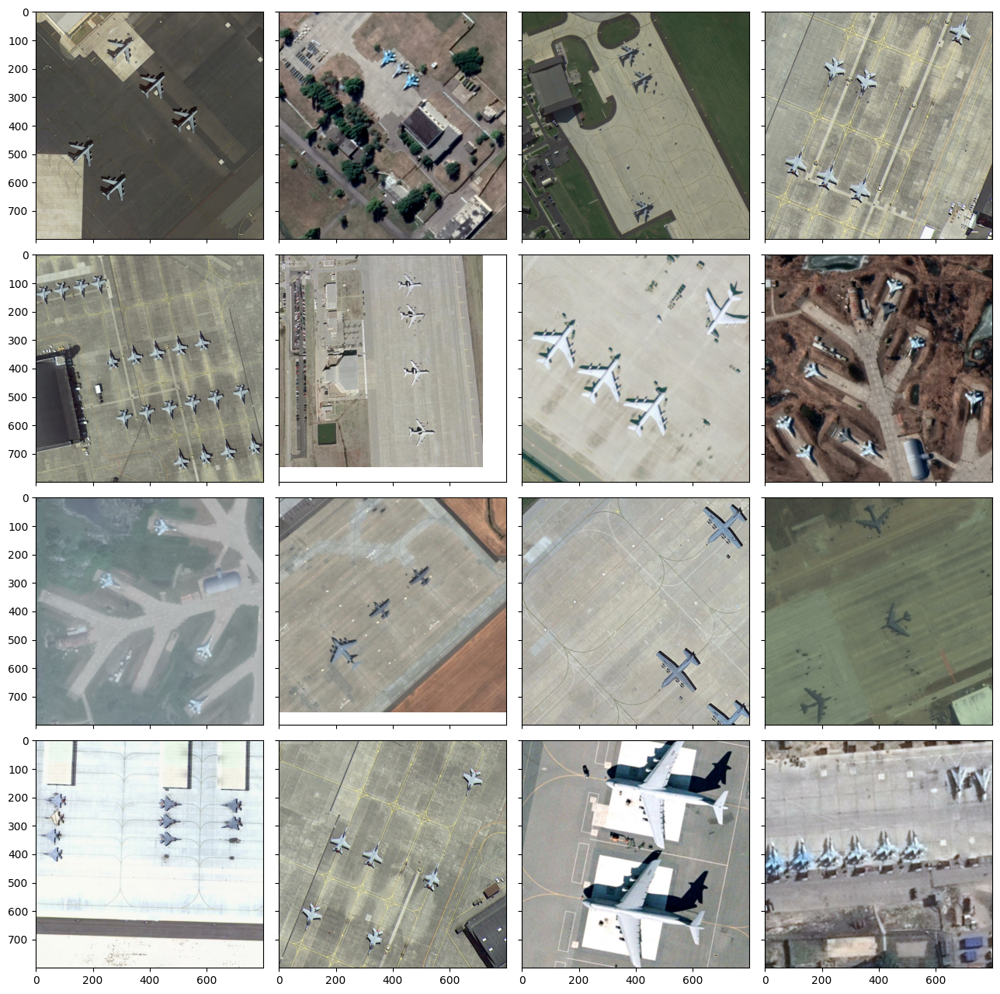

In [4]:
image_names = get_random_img_names()
display_grid(image_names)

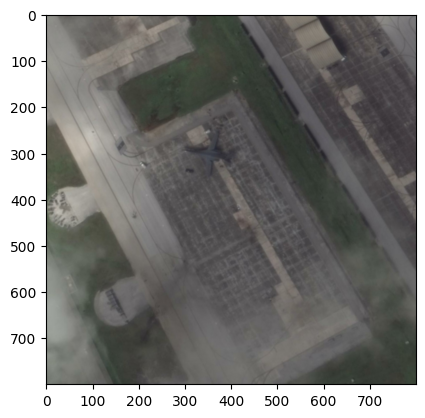

In [5]:
# Image with cloud/fog example
display_image('916.jpg')

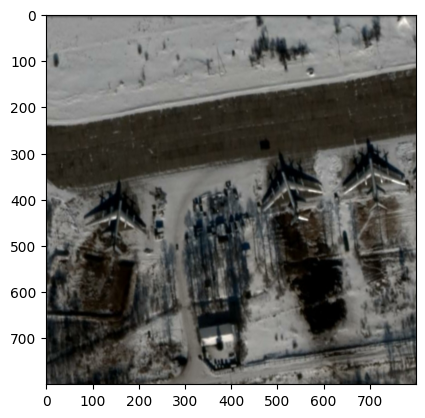

In [6]:
display_image('3062.jpg')

All images are in RGB format

In [7]:
# Checking channels
dims = []
for img_name in os.listdir(IMAGE_DIR):
    im = cv2.imread(IMAGE_DIR + img_name)
    if im.shape[2] not in dims:
        dims.append(im.shape[2])
dims

[3]

### Train/Test EDA

Everything else should be analyzed for train/test sets separately, so let's look at the data structure:

Annotations folder consist of two subfolders for Horizontal and Oriented bounding box. What box will be used depends on the model that will be trained. Format of files is xml.

The imagesets folder has subfolder Main that in it has two txt files for train and test sets. 

In [8]:
def get_train_set_ids():
    with open(TRAIN_SET_TXT, 'r') as file:
        ids = file.read().splitlines() 
    return ids

def get_test_set_ids():
    with open(TEST_SET_TXT, 'r') as file:
        ids = file.read().splitlines()
    return ids

Data consists of 1331 train images and 2511 test images

In [9]:
train_set_ids = get_train_set_ids()
test_set_ids = get_test_set_ids()
print(f'Size of train set is: {len(train_set_ids)}')
print(f'Size of test set is: {len(test_set_ids)}')
print(f'Total images: {len(train_set_ids) + len(test_set_ids)}')

Size of train set is: 1331
Size of test set is: 2511
Total images: 3842


### XML structure
Each xml has in it:
1) Filename 
2) Size of image ( width, height, dims )
3) Database ( probably where image come from )
4) segmented ? 
5) Object:
    - Name: name of the plane
    - bndbox: coordinates of bounding box

In [10]:
# XML reader
def parse_xml(xml_file_path: str):
    # Parses xml file, returns dict
    tree = ET.parse(xml_file_path)
    
    filename = tree.find('filename').text
    img_size = {
        'width': int(tree.find('size').find('width').text),
        'height': int(tree.find('size').find('height').text),
        'depth': int(tree.find('size').find('depth').text)
    }
    segmented = int(tree.find('segmented').text)
    bboxes = []
    for obj in tree.findall('object'):
        bndbox = obj.find('bndbox')
        bboxes.append({
            'name': obj.find('name').text,
            'xmin': int(bndbox.find('xmin').text),
            'ymin': int(bndbox.find('ymin').text),
            'xmax': int(bndbox.find('xmax').text),
            'ymax': int(bndbox.find('ymax').text)
        })
    database = tree.find('source').find('database').text
    
    return {
        'filename': filename,
        'img_size': img_size,
        'segmented': segmented,
        'bboxes': bboxes,
        'database': database
    }

def get_xml_file_path(filename, option='HORIZONTAL'):
    if option == 'HORIZONTAL':
        return HORIZONTAL_BB + filename
    elif option == 'ORIENTED':
        return ORIENTED_BB + filename

In [11]:
# Gather objects
objects_train = []
objects_test = []

for obj_id in train_set_ids:
    objects_train.append(parse_xml(get_xml_file_path(str(obj_id) + '.xml')))
    
for obj_id in test_set_ids:
    objects_test.append(parse_xml(get_xml_file_path(str(obj_id) + '.xml')))

In [12]:
# Dict from object train
objects_train[20]

{'filename': '2441.jpg',
 'img_size': {'width': 800, 'height': 800, 'depth': 3},
 'segmented': 0,
 'bboxes': [{'name': 'A13', 'xmin': 91, 'ymin': 453, 'xmax': 166, 'ymax': 551},
  {'name': 'A13', 'xmin': 151, 'ymin': 682, 'xmax': 229, 'ymax': 781},
  {'name': 'A13', 'xmin': 392, 'ymin': 454, 'xmax': 466, 'ymax': 554},
  {'name': 'A13', 'xmin': 362, 'ymin': 341, 'xmax': 441, 'ymax': 443},
  {'name': 'A13', 'xmin': 330, 'ymin': 233, 'xmax': 409, 'ymax': 334},
  {'name': 'A13', 'xmin': 304, 'ymin': 123, 'xmax': 379, 'ymax': 228},
  {'name': 'A13', 'xmin': 271, 'ymin': 14, 'xmax': 347, 'ymax': 114}],
 'database': 'MAR20'}

In [13]:
# Transfer dataset to pandas
def dataset_to_pandas(objects_train, objects_test):
    dataset = {
        'filename': [],
        'width': [],
        'height': [],
        'depth': [],
        'segmented': [],
        'database': [],
        'train': []
    }
    for obj in objects_train:
        for key in obj:
            if type(obj[key]) is list:
                continue
            elif type(obj[key]) is dict:
                for k in obj[key]:
                    dataset[k].append(obj[key][k])
            elif key in dataset:
                dataset[key].append(obj[key])
                
        dataset['train'].append(1)
        
    for obj in objects_test:
        for key in obj:
            if type(obj[key]) is list:
                continue
            elif type(obj[key]) is dict:
                for k in obj[key]:
                    dataset[k].append(obj[key][k])
            elif key in dataset:
                dataset[key].append(obj[key])
                
        dataset['train'].append(0)

    return pd.DataFrame.from_dict(dataset)

In [14]:
df = dataset_to_pandas(objects_train, objects_test)

In [15]:
df

,filename,width,height,depth,segmented,database,train
0,1680.jpg,800,800,3,0,MAR20,1
1,1518.jpg,800,800,3,0,MAR20,1
2,3423.jpg,800,800,3,0,MAR20,1
3,1406.jpg,800,800,3,0,MAR20,1
4,1072.jpg,800,800,3,0,MAR20,1
...,...,...,...,...,...,...,...
3837,915.jpg,800,800,3,0,MAR20,0
3838,919.jpg,800,800,3,0,MAR20,0
3839,925.jpg,800,800,3,0,MAR20,0
3840,942.jpg,800,800,3,0,MAR20,0


### Lets start analysing the pandas data

First, lets start from depth argument

In [16]:
# We can see that some of images have 1 dimension

df.depth.value_counts()

3    3835
1       7
Name: depth, dtype: int64

In [17]:
# Output those images

df[df['depth'] == 1]

,filename,width,height,depth,segmented,database,train
670,848.jpg,800,800,1,0,MAR20,1
2120,1891.jpg,800,800,1,0,MAR20,0
2122,1999.jpg,800,800,1,0,MAR20,0
2142,2830.jpg,800,800,1,0,MAR20,0
2639,2380.jpg,800,800,1,0,MAR20,0
2657,3162.jpg,800,800,1,0,MAR20,0
2677,3623.jpg,800,800,1,0,MAR20,0


In [18]:
# Try to read images to check their dims
for index, item in df[df['depth'] == 1].iterrows():
    image_path = IMAGE_DIR + item['filename']
    print(get_image(image_path).shape)

(800, 800, 3)
(800, 800, 3)
(800, 800, 3)
(800, 800, 3)
(800, 800, 3)
(800, 800, 3)
(800, 800, 3)


In [19]:
# Updating values of depth column
df.loc[df['depth'] == 1, ['depth']] = 3
df.depth.value_counts()

3    3842
Name: depth, dtype: int64

### Now lets analyse dimensions through all the images 

In [20]:
# We can see that the min value is 0??
df.width.describe()

count    3842.000000
mean      800.603332
std        73.691670
min         0.000000
25%       800.000000
50%       800.000000
75%       800.000000
max      1389.000000
Name: width, dtype: float64

In [21]:
# Output those images

df[df['width'] == 0]

,filename,width,height,depth,segmented,database,train
1806,326.jpg,0,0,3,0,MAR20,0
2387,476.jpg,0,0,3,0,MAR20,0
2391,480.jpg,0,0,3,0,MAR20,0
2392,482.jpg,0,0,3,0,MAR20,0
2711,442.jpg,0,0,3,0,MAR20,0
2712,443.jpg,0,0,3,0,MAR20,0
2794,334.jpg,0,0,3,0,MAR20,0
2795,335.jpg,0,0,3,0,MAR20,0
2798,338.jpg,0,0,3,0,MAR20,0
2800,340.jpg,0,0,3,0,MAR20,0


We can see that basically xml data is incorrect in width/height/depth parameters

So lets see only database and segmented parameters to understand what are they


In [22]:
# Everything comes from the same database, that is very nice!
df['database'].value_counts()

MAR20    3842
Name: database, dtype: int64

In [23]:
# Segmented is all 0 so it seems like it is not very important column
df['segmented'].value_counts()

0    3842
Name: segmented, dtype: int64

### Width and Height data analysis
In this section there will be general dimension analysis, without considering classes

In [43]:
# Get
train_width = []
test_width = []

train_height = []
test_height = []

outliers = []

for img_name in train_set_ids:
    im = cv2.imread(IMAGE_DIR + img_name + '.jpg')
    if im.shape[0] < 600 or im.shape[1] >= 1300 or im.shape[0] > 960:
        images.append(im)
    train_width.append(im.shape[0])
    train_height.append(im.shape[1])

for img_name in test_set_ids:
    im = cv2.imread(IMAGE_DIR + img_name + '.jpg')
    if im.shape[0] < 600 or im.shape[1] >= 1300 or im.shape[0] > 960:
        images.append(im)
    test_width.append(im.shape[0])
    test_height.append(im.shape[1])
    
    
width = np.array(train_width + test_width)
height = np.array(train_height + test_height)

In [45]:
# To arrays
train_width, test_width, train_height, test_height = np.array(train_width), np.array(test_width), np.array(train_height), np.array(test_height)

In [46]:
# We have ~15 outliers that we can see from graph regarding image size ( height + wise )
len(images)

26

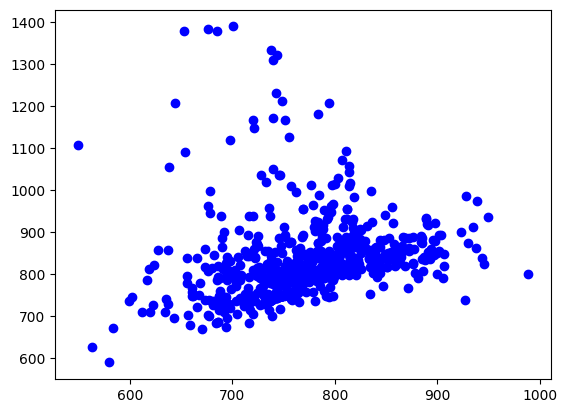

In [60]:
# Width to height graph
plt.plot(width, height, 'bo')

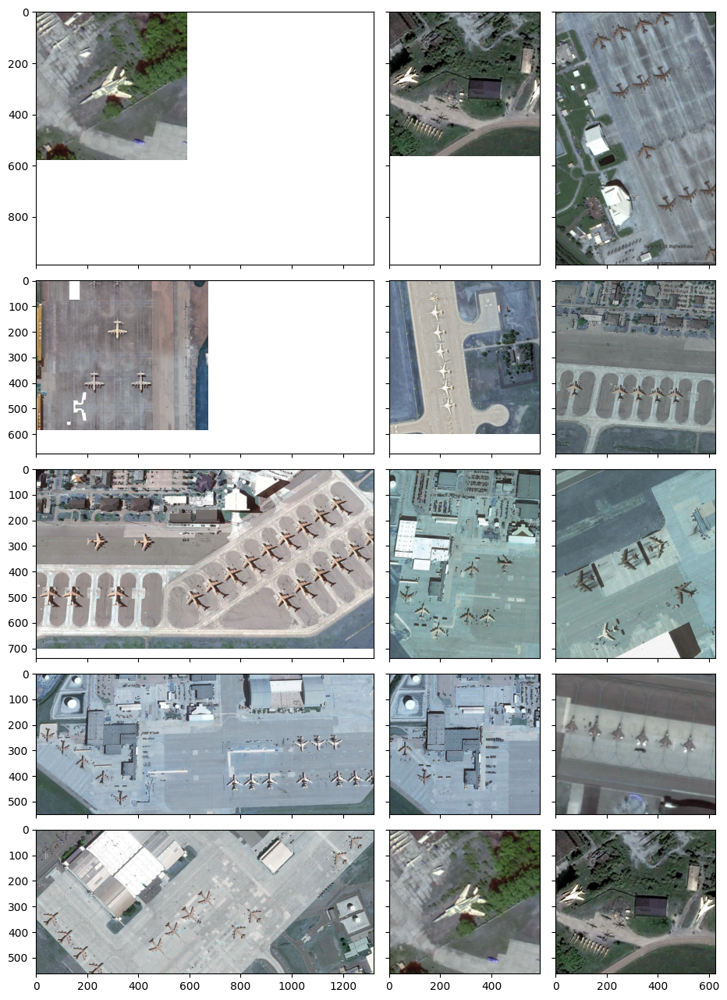

In [48]:
fig = plt.figure(figsize=(16., 16.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(5, 3),  # creates 2x2 grid of axes
                     axes_pad=0.2,  # pad between axes in inch.
                     )
    
for ax, im_name in zip(grid, images):
    # Iterating over the grid returns the Axes.
#     image_path = IMAGE_DIR + im_name
    ax.imshow(im_name)

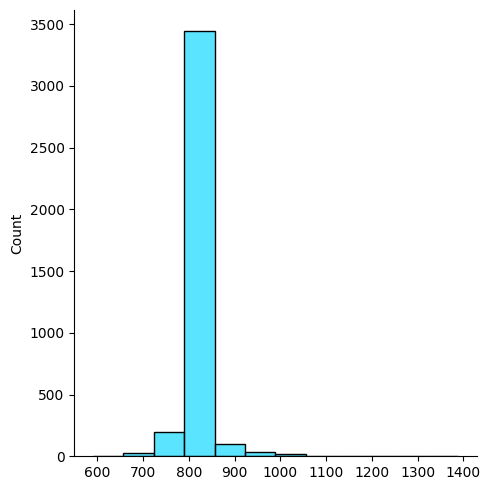

In [69]:
# Height distribution
# Some outliers should be in the right tail
sns.displot(height, bins=12)

In [70]:
# Percentage of height < 900
# Only 92 values higher than 900, seems like a nice candidate for reshaping
higher_than_900 = (height > 900).sum()
higher_than_900

92

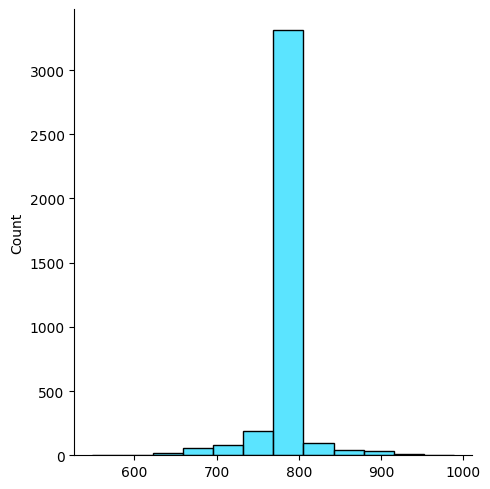

In [71]:
# Width distribution
# Some outliers in left tail?
sns.displot(width, bins=12)

In [72]:
# Percentage of width < 900
# Only 17 values higher than 900, seems like a nice candidate for reshaping as well
higher_than_900_w = (width > 900).sum()
higher_than_900_w

17

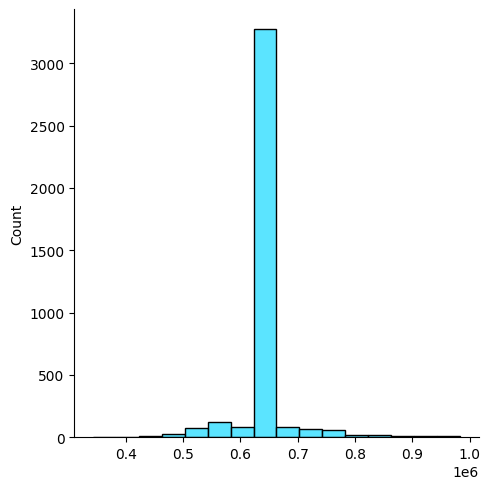

In [73]:
# Area distribution
sns.displot(width * height, bins=16)

<Axes: >

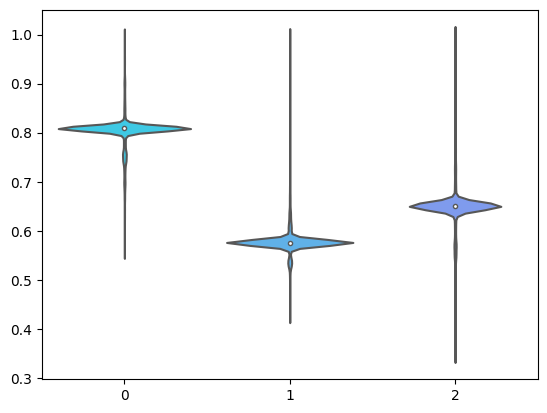

In [74]:
# Violin plots for width, height, area
# Many outliers to IQR, but we cannot remove them as dataset will shrink significantly
sns.violinplot([width / max(width), height/max(height), (width * height) / max(width * height)])

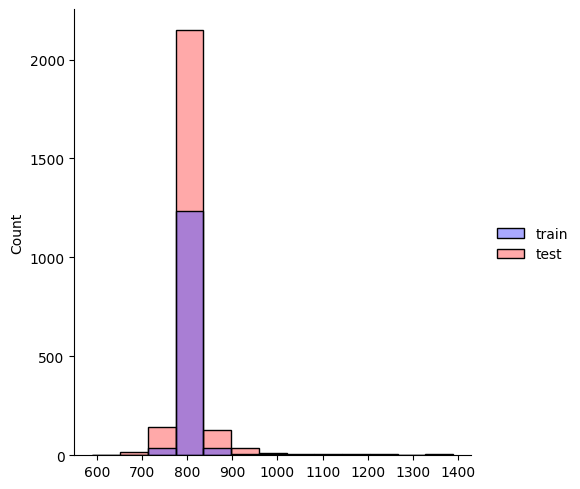

In [79]:
# Height Distribution by set
sns.displot({'train': train_height, 'test':test_height}, palette='seismic')

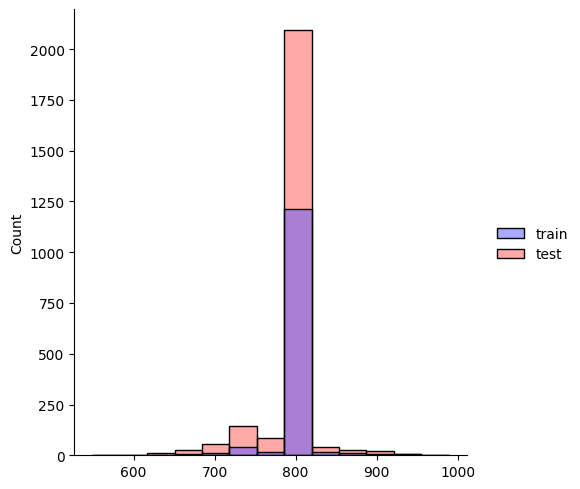

In [80]:
# Distribution by set
sns.displot({'train': train_width, 'test':test_width}, palette='seismic')

In [81]:
# Summarizing, distributions are pretty similar

## Classes + Bounding boxes analysis

In [139]:
# Create pandas dataset of bounding boxes
objects = {
    'obj_id': [],
    'class_name': [],
    'xmin': [],
    'xmax': [],
    'ymin': [],
    'ymax': [],
    'is_train': []
}

for obj_id in train_set_ids:
    xml_parsed = parse_xml(get_xml_file_path(str(obj_id) + '.xml'))
    for bbox in xml_parsed['bboxes']:
        objects['obj_id'].append(obj_id)
        objects['class_name'].append(bbox['name'])
        objects['xmin'].append(bbox['xmin'])
        objects['xmax'].append(bbox['xmax'])
        objects['ymin'].append(bbox['ymin'])
        objects['ymax'].append(bbox['ymax'])
        objects['is_train'].append(True)
        
for obj_id in test_set_ids:
    xml_parsed = parse_xml(get_xml_file_path(str(obj_id) + '.xml'))
    for bbox in xml_parsed['bboxes']:
        objects['obj_id'].append(obj_id)
        objects['class_name'].append(bbox['name'])
        objects['xmin'].append(bbox['xmin'])
        objects['xmax'].append(bbox['xmax'])
        objects['ymin'].append(bbox['ymin'])
        objects['ymax'].append(bbox['ymax'])
        objects['is_train'].append(False)
        
df = pd.DataFrame.from_dict(objects)

In [141]:
df.head()

,obj_id,class_name,xmin,xmax,ymin,ymax,is_train
0,1680,A19,282,345,106,169,True
1,1680,A19,101,165,193,254,True
2,1680,A19,64,129,150,211,True
3,1680,A19,21,85,104,168,True
4,1680,A1,146,207,241,302,True


In [142]:
df.describe()

,xmin,xmax,ymin,ymax
count,22341.000000,22341.000000,22341.000000,22341.000000
mean,352.858466,454.535876,337.855244,438.733047
std,199.278432,199.009092,194.779591,196.491608
min,1.000000,24.000000,1.000000,16.000000
25%,192.000000,293.000000,178.000000,281.000000
50%,349.000000,450.000000,331.000000,432.000000
75%,507.000000,610.000000,494.000000,597.000000
max,1287.000000,1356.000000,911.000000,981.000000


In [152]:
# To preserve same order
order = df.class_name.unique()
order

array(['A19', 'A1', 'A20', 'A16', 'A5', 'A13', 'A15', 'A3', 'A17', 'A11',
       'A14', 'A8', 'A2', 'A10', 'A9', 'A4', 'A18', 'A7', 'A12', 'A6'],
      dtype=object)

<Axes: xlabel='class_name', ylabel='count'>

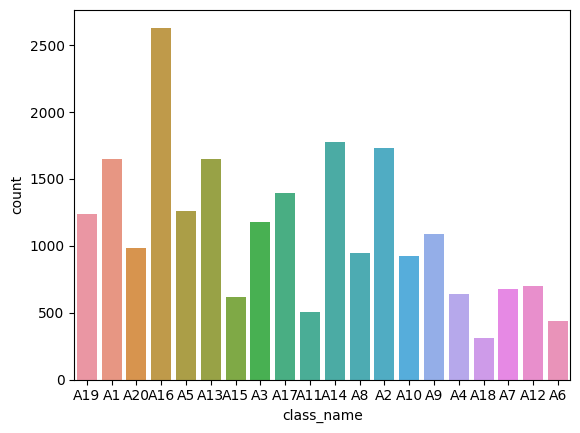

In [153]:
# We can see that there is class imbalance in data
sns.countplot(df, x='class_name', order=order)

In [154]:
df.class_name.value_counts() # 308 to 2632

A16    2632
A14    1778
A2     1729
A13    1652
A1     1646
A17    1397
A5     1262
A19    1236
A3     1176
A9     1086
A20     981
A8      944
A10     924
A12     702
A7      680
A4      642
A15     618
A11     507
A6      441
A18     308
Name: class_name, dtype: int64

<Axes: xlabel='class_name', ylabel='count'>

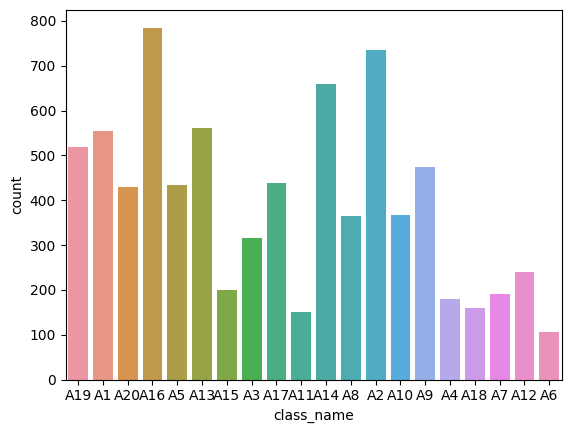

In [155]:
# Train set distribution
# We can see that distribution is pretty like overall distribution, with some minor differences
sns.countplot(df[df['is_train']], x='class_name', order=order)

<Axes: xlabel='class_name', ylabel='count'>

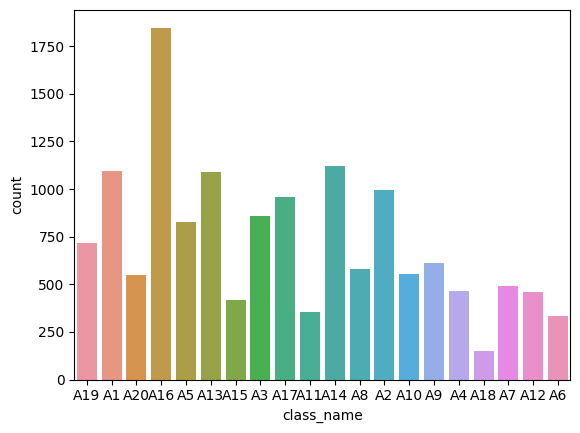

In [157]:
# Test set distribution
# Same here, maybe some differences in A20 A9 and A18, but overall its a good test set
sns.countplot(df[df['is_train'] == False], x='class_name', order=order)

## Bounding Boxes visualization

In [122]:
# Visualization
def get_bounding_boxes(obj_id: str):
    fpath = get_xml_file_path(str(obj_id) + ".xml")
    xml_parsed = parse_xml(fpath)
    bounding_boxes = xml_parsed["bboxes"]
    
    return bounding_boxes

def draw_boxes(image, bounding_boxes: list):
    for bbox in bounding_boxes:
        image = cv2.rectangle(image, (bbox['xmin'], bbox['ymin']), (bbox['xmax'], bbox['ymax']), (255,0,0), 2)
        cv2.putText(image, bbox['name'], (bbox['xmin'], bbox['ymin']-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,20,20), 3)
    
    return image

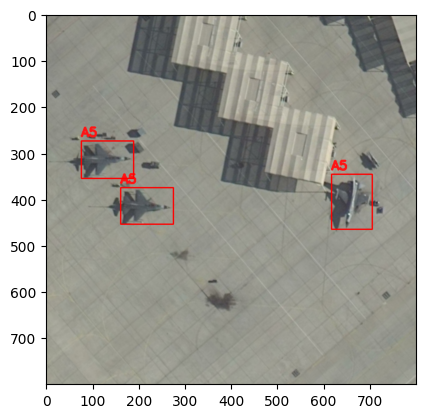

In [123]:
# Display image with bounding boxes
image_id = random.choice(train_set_ids)
bboxes = get_bounding_boxes(str(image_id))
img = get_image_from_id(str(image_id))

plt.imshow(draw_boxes(img, bboxes))

In [158]:
def display_grid_with_bboxes(image_names_list: list):
    # Displays 4 x 4 grid
    #     images = [get_image(name) for name in image_names_list]
    
    fig = plt.figure(figsize=(16., 16.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(4, 4),  # creates 2x2 grid of axes
                     axes_pad=0.2,  # pad between axes in inch.
                     )
    
    for ax, im_name in zip(grid, image_names_list):
        # Iterating over the grid returns the Axes.
        bboxes = get_bounding_boxes(str(im_name))
        img = get_image_from_id(str(im_name))
        ax.imshow(draw_boxes(img, bboxes))

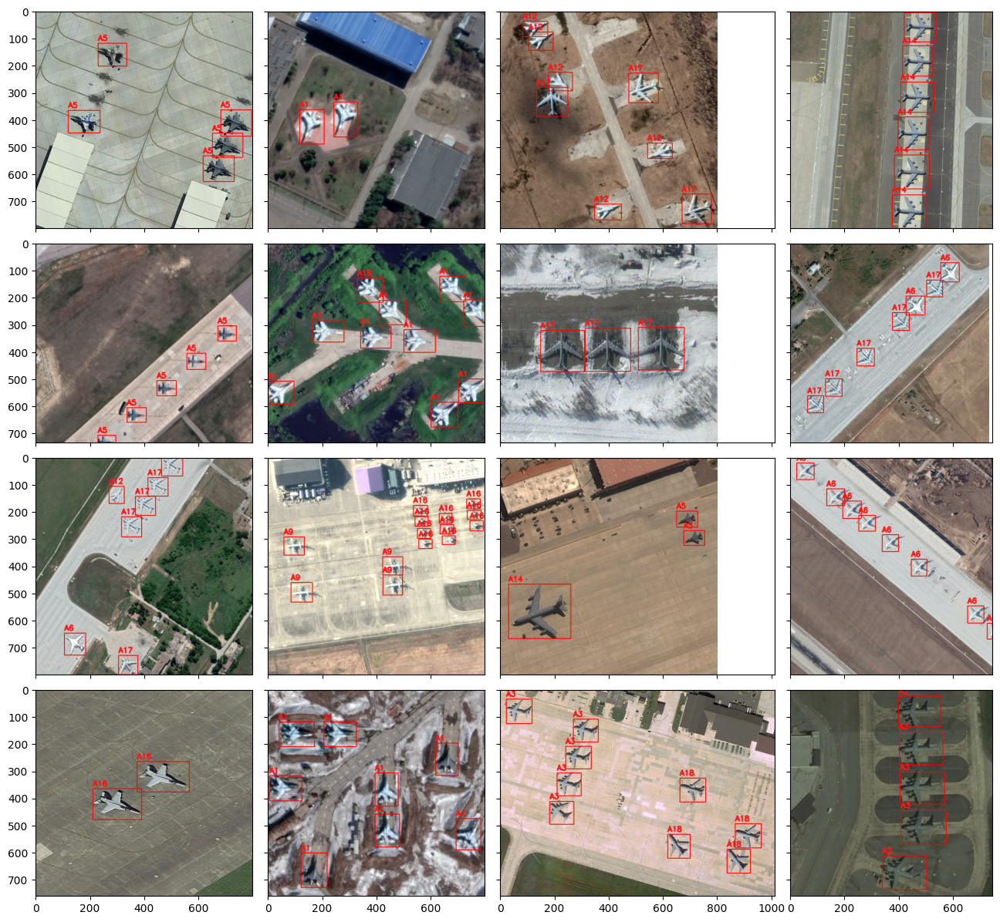

In [159]:
# Random sampling
image_ids = random.sample(test_set_ids, 16)
display_grid_with_bboxes(image_ids)

### Bounding boxes analysis

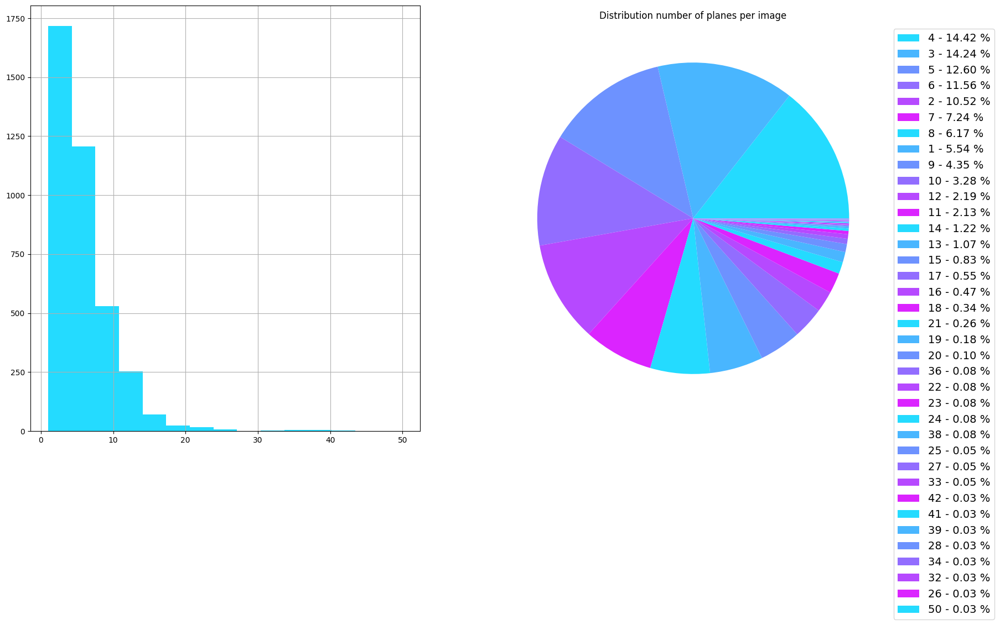

In [186]:
# Bounding box count per image
counts_per_img = df['obj_id'].value_counts()
# Height Distribution by set
plane_nums = counts_per_img

f,ax=plt.subplots(1, 2,figsize=(20,10))
plane_nums.hist(bins = 15, ax=ax[0])

y = plane_nums.value_counts().values
percent = 100.*y/y.sum()
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(ships_numbers.value_counts().index.get_level_values(0), percent)]
ships_numbers.value_counts().plot.pie(labels=None, ax=ax[1])
ax[1].legend(labels, bbox_to_anchor=(1., 1.), fontsize=14)
ax[1].yaxis.set_visible(False)
ax[1].set_title('Distribution number of planes per image')

plt.show()

As we can see from stats above, we have some outliers, images > ~35 objects

In [198]:
# List ids
print(counts_per_img[counts_per_img == 41])
print(counts_per_img[counts_per_img == 50])
print(counts_per_img[counts_per_img == 42])

1700    41
Name: obj_id, dtype: int64
3607    50
Name: obj_id, dtype: int64
901    42
Name: obj_id, dtype: int64


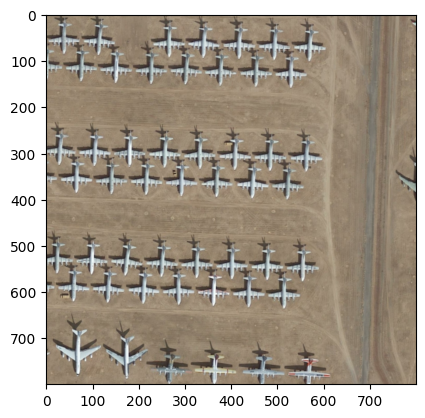

In [199]:
display_image('3607.jpg')

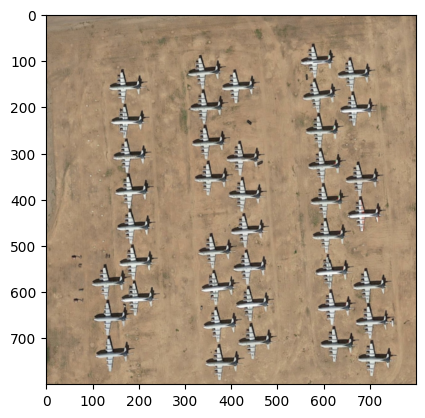

In [200]:
display_image('1700.jpg')

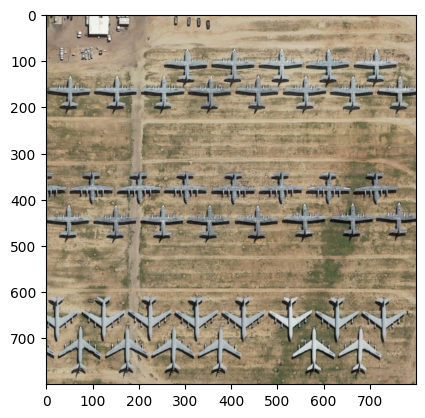

In [201]:
display_image('901.jpg')

In [202]:
df

,obj_id,class_name,xmin,xmax,ymin,ymax,is_train
0,1680,A19,282,345,106,169,True
1,1680,A19,101,165,193,254,True
2,1680,A19,64,129,150,211,True
3,1680,A19,21,85,104,168,True
4,1680,A1,146,207,241,302,True
...,...,...,...,...,...,...,...
22336,949,A5,199,282,46,149,False
22337,949,A5,425,511,1,92,False
22338,949,A5,584,663,655,755,False
22339,949,A5,466,554,683,783,False


Bounding box area distribution

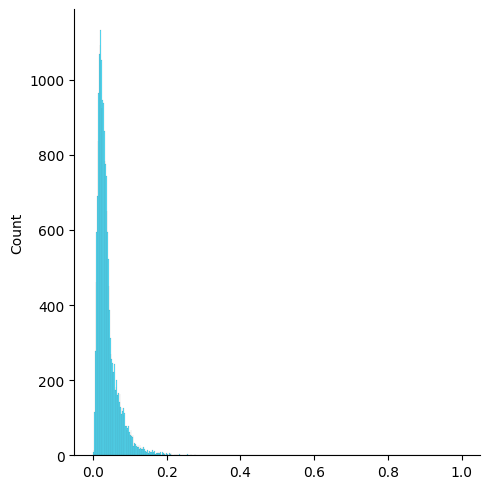

In [209]:
area = (df['xmax'] - df['xmin']) * (df['ymax'] - df['ymin'])
sns.displot(area / max(area), kde=False)

Bounding box percentage of an image

In [211]:
for ind, row in df[df['obj_id'] == '1'].iterrows():
    print(row.xmin)

485
694
58


In [212]:
train_plain_percantage = []
for img_name in train_set_ids:
    im = cv2.imread(IMAGE_DIR + img_name + '.jpg')
    w = im.shape[0]
    h = im.shape[1]
    
    bboxes = df[df['obj_id'] == img_name]
    overal_bboxes_size = 0
    for indx, row in bboxes.iterrows():
        overal_bboxes_size += (row.xmax - row.xmin) * (row.ymax-row.ymin)
    train_plain_percantage.append(overal_bboxes_size / (w * h))

test_plain_percantage = []
for img_name in test_set_ids:
    im = cv2.imread(IMAGE_DIR + img_name + '.jpg')
    w = im.shape[0]
    h = im.shape[1]
    
    bboxes = df[df['obj_id'] == img_name]
    overal_bboxes_size = 0
    for indx, row in bboxes.iterrows():
        overal_bboxes_size += (row.xmax - row.xmin) * (row.ymax-row.ymin)
    test_plain_percantage.append(overal_bboxes_size / (w * h))
    
overall_bbox_area_perc = train_plain_percantage + test_plain_percantage
overall_bbox_area_perc = np.array(overall_bbox_area_perc)

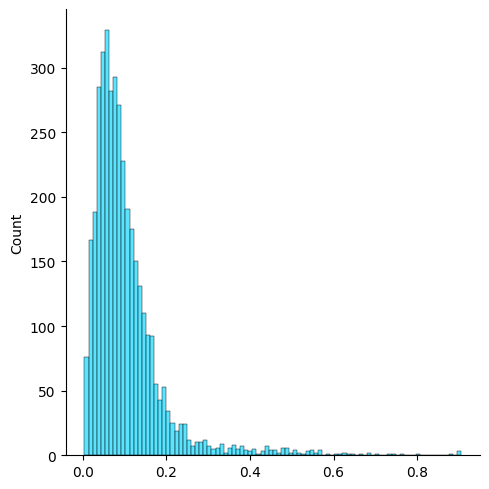

In [213]:
# Big amount of small objects, we need to keep it in mind when working with model
sns.displot(overall_bbox_area_perc, kde=False)

<Axes: >

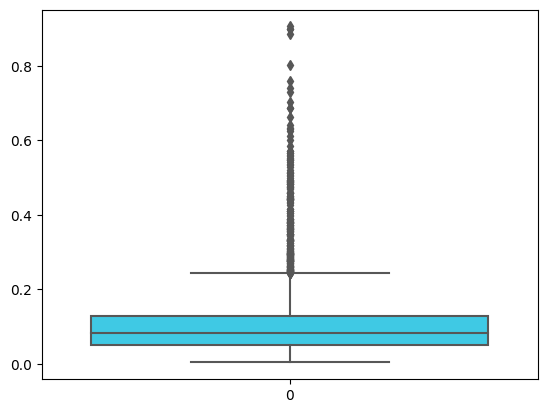

In [215]:
sns.boxplot(overall_bbox_area_perc)

Area of planes by plane type

In [239]:
planes_area_by_type = {}
for plane in df.class_name.unique():
    # count
    plane_count = df.class_name.value_counts()[plane]
    plane_only_columns = df[df['class_name'] == plane]
    plane_area = (plane_only_columns.xmax - plane_only_columns.xmin) * (plane_only_columns.ymax - plane_only_columns.ymin)
    planes_area_by_type[plane] = np.median(plane_area.values)

<Axes: >

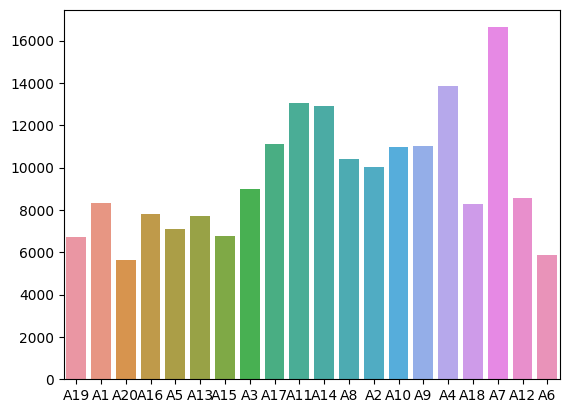

In [241]:
# We can see that the minimal values is for A20 and largets value is for A4
sns.barplot(x=list(planes_area_by_type.keys()), y=list(planes_area_by_type.values()), order=order)

<Axes: >

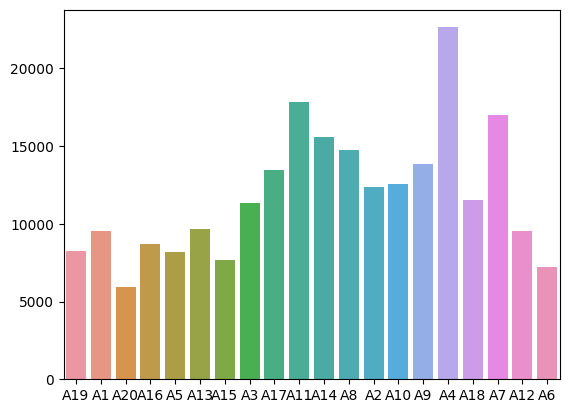

In [243]:
# Interesting that if we'll get avg instead of mode, next thing appears
planes_area_by_type = {}
for plane in df.class_name.unique():
    # count
    plane_count = df.class_name.value_counts()[plane]
    plane_only_columns = df[df['class_name'] == plane]
    plane_area = (plane_only_columns.xmax - plane_only_columns.xmin) * (plane_only_columns.ymax - plane_only_columns.ymin)
    planes_area_by_type[plane] = np.sum(plane_area.values) / plane_count
    
# A4 now is the largest one
# It means that somewhere in A4 outliers presented, so it might be actually bad for metric
sns.barplot(x=list(planes_area_by_type.keys()), y=list(planes_area_by_type.values()), order=order)